In [12]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import fetch_openml
import umap

In [13]:
mnist = fetch_openml('Fashion-MNIST', version=1, cache=True)

In [14]:
np.random.seed(123)

indices = np.random.choice(len(mnist.data), 10000)
X = mnist.data.loc[indices] / 255.0 # Divide by 255 to normalize for RGB (red, green, blue) in image data
y = mnist.target.loc[indices]

print(X.shape, y.shape)

(10000, 784) (10000,)


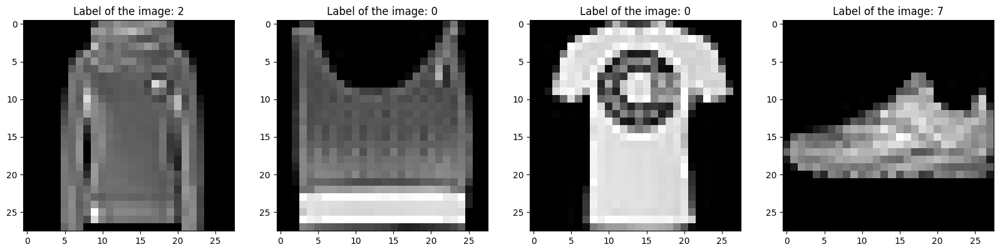

In [15]:
plt.figure(figsize=(20,5))

plt.subplot(141)
plt.imshow(X.iloc[123].values.reshape(28,28), cmap="gray")
plt.title("Label of the image: {}".format(y.iloc[123]))

plt.subplot(142)
plt.imshow(X.iloc[124].values.reshape(28,28), cmap="gray")
plt.title("Label of the image: {}".format(y.iloc[124]))

plt.subplot(143)
plt.imshow(X.iloc[125].values.reshape(28,28), cmap="gray")
plt.title("Label of the image: {}".format(y.iloc[125]))

plt.subplot(144)
plt.imshow(X.iloc[126].values.reshape(28,28), cmap="gray")
plt.title("Label of the image: {}".format(y.iloc[126]))

plt.show()

In [16]:
import time
time_start = time.time()

umap_results = umap.UMAP(n_neighbors=5,
                      min_dist=0.3,
                      metric='correlation').fit_transform(X)

print('UMAP done! Time elapsed: {} seconds'.format(time.time()-time_start))

UMAP done! Time elapsed: 8.776298999786377 seconds


In [17]:
def plot(umap_results):
 plt.figure(figsize=(10,5))
 colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
 for i in range(umap_results.shape[0]):
    plt.text(umap_results[i, 0], umap_results[i, 1], str(y.iloc[i]),
             color=colours[int(y.iloc[i])],
             fontdict={'weight': 'bold', 'size': 50}
        )

 plt.xticks([])
 plt.yticks([])
 plt.axis('off')
 plt.show()
plot(umap_results)

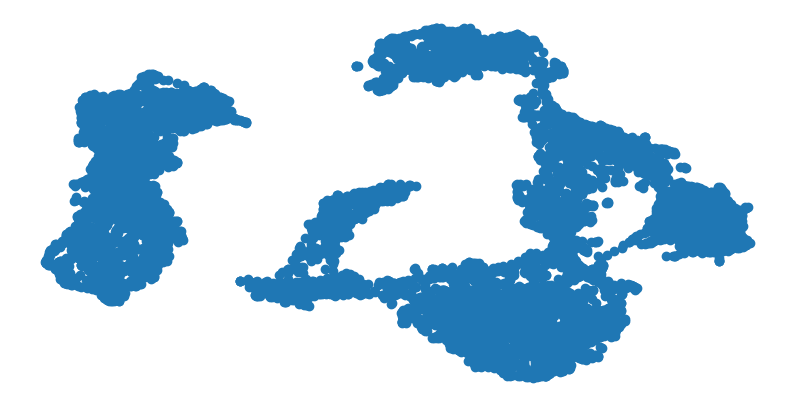

In [18]:
plt.figure(figsize=(10,5))
plt.scatter(umap_results[:, 0], umap_results[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

## umap provided better clustering in data after dimensionality reduction compared to pca and t-sne
